# Project day
In this notebook, we introduce you to tasks you will be completing in your Final Project.

# Evaluating ML models

In QTM 220, you learned how to use linear models and their variants. The focus in that class was on the statistics of the models and their estimation. 

Many ML models return a 'confidence score' or similarly named numerical measure.

We will be using what you learned to evaluate AWS ML models.

## AI Folklore
> One famous example is of a US Army neural network tank classifier. It was shown examples of US tanks from many different distances and angles on a bright sunny day, and examples of Soviet tanks on a cloudy day. Needless to say it was great at classifying weather, but not so good at picking out enemy tanks.

I originally heard this story from [Chris Benson](https://www.linkedin.com/in/chrisbenson/). I thought it was original in his telling, as he explained that his father had been an early investigator in the use of neural networks for the Air Force. He didn't claim it was original.

Indeed, I recently stumbled across [this page](https://www.gwern.net/Tanks), pointing out that it is 'AI folklore' and has been recounted numerous places throughout the literature. The text above is one of the references in this page.

## Uncovering hidden variables
Using any of the AWS ML services, can you reveal similar hidden variables? Use what you learned in QTM 220 to quantify the statistical evidence demonstrating that these variables really do impact the classification's confidence score in the way that you describe.


## Example

### When do I look the most like myself?
I uploaded my Emory ID photo as well as fifty pictures of myself. Let's apply Rekognition to obtain the confidence score, then find out which images the confidence score is highest on. In other words, in what pictures do I look the most like myself, where I mean, *the most like whatever the model thinks I look like based on the image I gave it of the picture in my Emory ID*.

Now, run the `aws s3 ls` command to list buckets.

In [9]:
!aws s3 ls

2021-03-11 23:37:13 public-webpage-lauren


Having run the cell above, the file should no longer appear in the JupyterLab file viewer. Let's check what is in the bucket we made now.

In [12]:
!aws s3 mb s3://project-template-350-lauren

make_bucket: project-template-350-lauren


In [62]:
!aws s3 ls project-template-350-lauren

2021-03-25 22:58:11     510271 Beatriz_Eating.jpeg
2021-03-25 23:00:35    2299555 Lauren_IceCream.jpeg
2021-03-25 23:00:51     463202 Lauren_Samuel.jpeg
2021-03-25 23:00:05     270363 Lauren_Snapchat_FilterSmile.jpeg


Good, we see that the images are in the bucket. Let's move on to the next step.

#### Rekognition `compare faces` with the Python SDK
This example uses the output from the `compare-faces` call to the Rekognition API.
We start by importing the package which containts the code for the Python SDK, `boto3`.

In [14]:
#Copyright 2018 Amazon.com, Inc. or its affiliates. All Rights Reserved.
#PDX-License-Identifier: MIT-0 (For details, see https://github.com/awsdocs/amazon-rekognition-developer-guide/blob/master/LICENSE-SAMPLECODE.)

import boto3

Next, we create an instance `client` of the client object in the `boto3` package for `rekognition`. It will allow use to communicate and make requests to the Rekognition service using Python. 

In [15]:
client=boto3.client('rekognition')

Now, using the client, we use the dot notation to access one of its methods, `detect_labels`. This example displays the labels that were detected in the input image. Again, replace the values of bucket and photo with the names of the Amazon S3 bucket and image that you used.

Below we apply it to the original image, the picture from my Emory ID.

In [65]:
response = client.detect_labels(Image={'S3Object':{'Bucket':"project-template-350-lauren",'Name':"Lauren_Samuel.jpeg"}}, MaxLabels=10)

Let's investigate what we have obtained as a response.

In [66]:
type(response)

dict

We see that it is a Python dictionary. Let's see what are the keys.

In [67]:
response.keys()

dict_keys(['Labels', 'LabelModelVersion', 'ResponseMetadata'])

Let's have a look at the values for the `Labels` key.

In [68]:
response['Labels']

[{'Name': 'Clothing',
  'Confidence': 99.70648956298828,
  'Instances': [],
  'Parents': []},
 {'Name': 'Ceiling Fan',
  'Confidence': 99.02747344970703,
  'Instances': [{'BoundingBox': {'Width': 0.908976674079895,
     'Height': 0.3755955398082733,
     'Left': 0.0,
     'Top': 0.0},
    'Confidence': 99.02747344970703}],
  'Parents': []},
 {'Name': 'Person',
  'Confidence': 98.94508361816406,
  'Instances': [{'BoundingBox': {'Width': 0.9644606709480286,
     'Height': 0.7081925272941589,
     'Left': 0.03469756245613098,
     'Top': 0.2735329866409302},
    'Confidence': 98.94508361816406}],
  'Parents': []},
 {'Name': 'Hat',
  'Confidence': 97.5960464477539,
  'Instances': [{'BoundingBox': {'Width': 0.46652016043663025,
     'Height': 0.2518317997455597,
     'Left': 0.007741806097328663,
     'Top': 0.34365570545196533},
    'Confidence': 97.5960464477539}],
  'Parents': [{'Name': 'Clothing'}]},
 {'Name': 'Glasses',
  'Confidence': 97.21728515625,
  'Instances': [{'BoundingBox': {'

Now, lets loop through the images in the bucket. To do this we will first make a Python list of all the images in the bucket. First we make an instance of an object `s3_resource` that will allow us to communicate with S3.  

In [69]:
s3_resource = boto3.resource('s3')
my_bucket = s3_resource.Bucket('project-template-350-lauren')
summaries = my_bucket.objects.all()
summaries

s3.Bucket.objectsCollection(s3.Bucket(name='project-template-350-lauren'), s3.ObjectSummary)

In [90]:
images = []
for image in summaries:
    images.append(image.key)
images

['Beatriz_Eating.jpeg',
 'Lauren_IceCream.jpeg',
 'Lauren_Samuel.jpeg',
 'Lauren_Snapchat_FilterSmile.jpeg']

In [71]:
# Comparing Beatriz's photo as target image
# Shows that we are not a match!
client.compare_faces(SourceImage={'S3Object':{'Bucket':"project-template-350-lauren",'Name':"Lauren_IceCream.jpeg"}}, TargetImage={'S3Object':{'Bucket':"project-template-350-lauren",'Name':'Beatriz_Eating.jpeg'}})

{'SourceImageFace': {'BoundingBox': {'Width': 0.23526090383529663,
   'Height': 0.24851733446121216,
   'Left': 0.36326172947883606,
   'Top': 0.21209874749183655},
  'Confidence': 99.99786376953125},
 'FaceMatches': [],
 'UnmatchedFaces': [{'BoundingBox': {'Width': 0.2184034138917923,
    'Height': 0.16943350434303284,
    'Left': 0.37071463465690613,
    'Top': 0.21284957230091095},
   'Confidence': 99.99868774414062,
   'Landmarks': [{'Type': 'eyeLeft',
     'X': 0.43793797492980957,
     'Y': 0.27950742840766907},
    {'Type': 'eyeRight', 'X': 0.5388267040252686, 'Y': 0.28738391399383545},
    {'Type': 'mouthLeft', 'X': 0.4314929246902466, 'Y': 0.33582770824432373},
    {'Type': 'mouthRight', 'X': 0.5158501863479614, 'Y': 0.34237268567085266},
    {'Type': 'nose', 'X': 0.48455193638801575, 'Y': 0.3170631527900696}],
   'Pose': {'Roll': 6.894494533538818,
    'Yaw': 4.177940845489502,
    'Pitch': -3.221923589706421},
   'Quality': {'Brightness': 72.3833236694336,
    'Sharpness': 7

In [91]:
confidence_dict={}
for image in images[:-1]: #[:-1] add this if the last image in your list is the target image
                    #[1:] add this if the first image in your list is the target image
    try:
        comparison = client.compare_faces(SourceImage={'S3Object':{'Bucket':"project-template-350-lauren",'Name':"Lauren_Snapchat_FilterSmile.jpeg"}}, TargetImage={'S3Object':{'Bucket':"project-template-350-lauren",'Name':image}})
        face_match = comparison['FaceMatches']
        image_score = face_match[0]['Similarity']
        confidence_dict[image] = image_score
    except Exception:
        pass
    

In [92]:
# Showing us the similarity score to the source image! Very cool
confidence_dict

{'Lauren_IceCream.jpeg': 99.9944076538086,
 'Lauren_Samuel.jpeg': 99.93186950683594}

In [93]:
sorted(confidence_dict, key=confidence_dict.__getitem__)

['Lauren_Samuel.jpeg', 'Lauren_IceCream.jpeg']

Now, let's look at the least similar image.

In [94]:
min(confidence_dict, key=confidence_dict.get)

'Lauren_Samuel.jpeg'

In [95]:
max(confidence_dict, key=confidence_dict.get)

'Lauren_IceCream.jpeg'

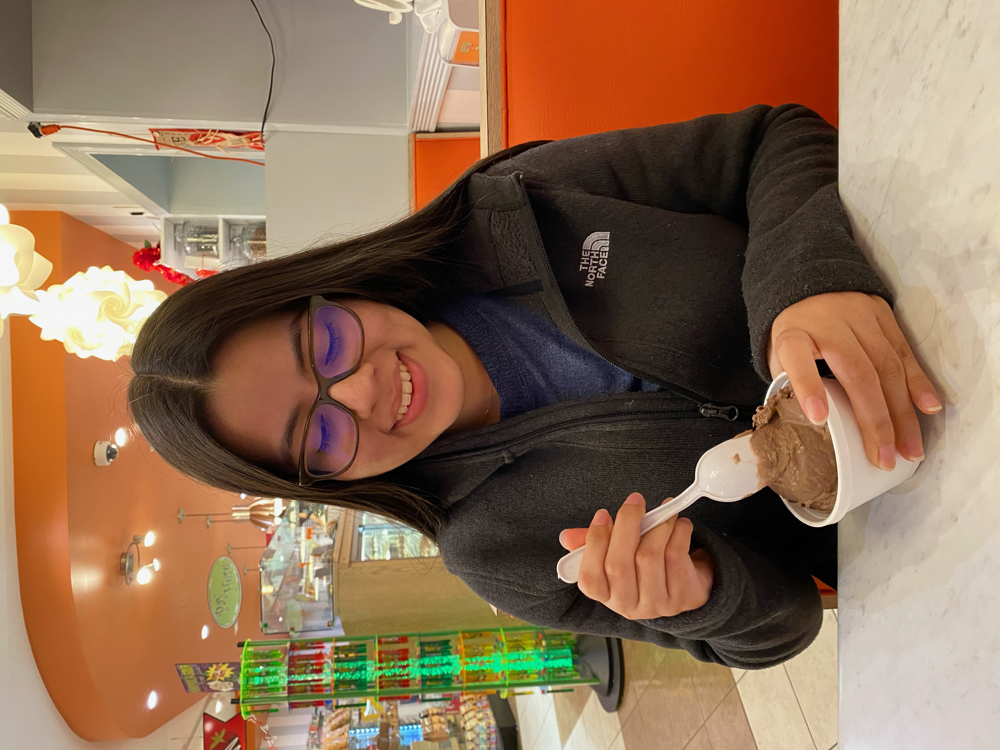

In [96]:
from PIL import Image
import s3fs

fs = s3fs.S3FileSystem()
with fs.open(f's3://project-template-350-lauren/Lauren_IceCream.jpeg') as f:
    display(Image.open(f))

So it looks like it is sensitive to the rotation of images, although it is not supposed to be.

Also, I apparently have an *ID picture face* that I make.

There is much more that can be done. That is for you to experiment with and explore.